In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import imutils

plt.rcParams['figure.figsize'] = [15, 15]

In [2]:
img_bgr = cv2.imread('images/rangebots.png')
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
template = cv2.imread('images/truetemplate.png', 0)
#template_rgb = cv2.cvtColor(template, cv2.COLOR_BGR2RGB)

# Simple Template Matching: template from the image with fixed size

In [3]:
#Reading the input image and the template image
img = cv2.imread('images/rangebots.png', 0)
img2 = img.copy()
template = cv2.imread('images/truetemplate.png', 0)
w, h = template.shape[::-1]


def return_bouding_box(img, template, method):
    """
    Takes in the input image, the template and the method for comparaison
    Outputs the top left and bottom right of the bouding box
    """
    w, h = template.shape[::-1]
    res = cv2.matchTemplate(img, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    return top_left, bottom_right

### cv2.TM_CCOEFF and cv2.TM_CCOEFF_NORMED

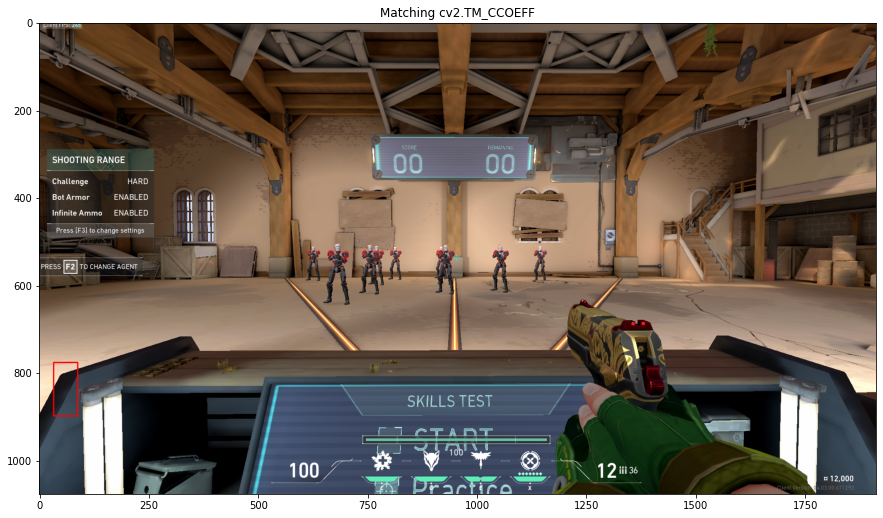

In [4]:
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCOEFF)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.title('Matching cv2.TM_CCOEFF')
plt.imshow(img_rgb)

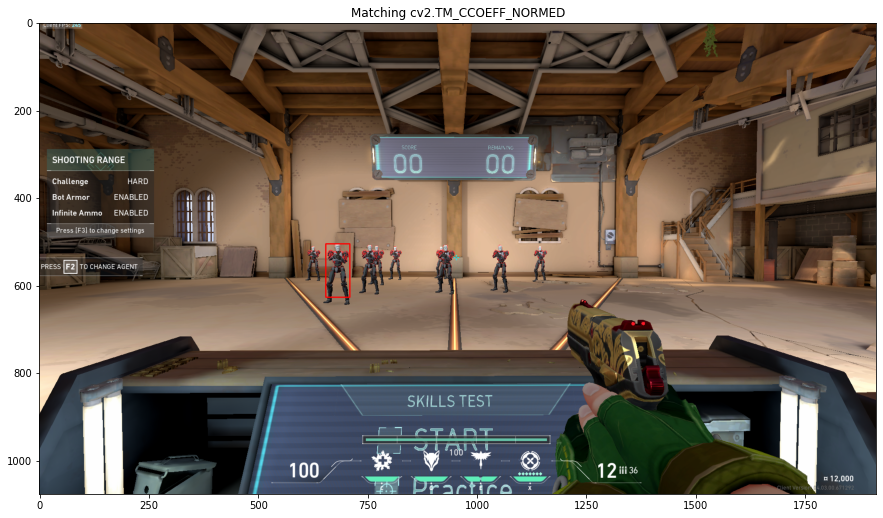

In [5]:
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCOEFF_NORMED)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.title('Matching cv2.TM_CCOEFF_NORMED')
plt.imshow(img_rgb)

### TM_CCORR and TM_CCORR_NORMED

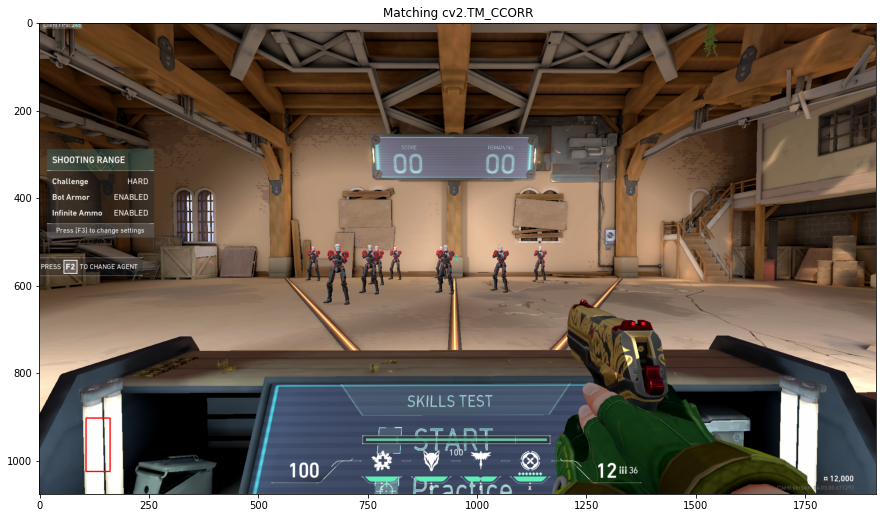

In [6]:
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCORR)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.title('Matching cv2.TM_CCORR')
plt.imshow(img_rgb)

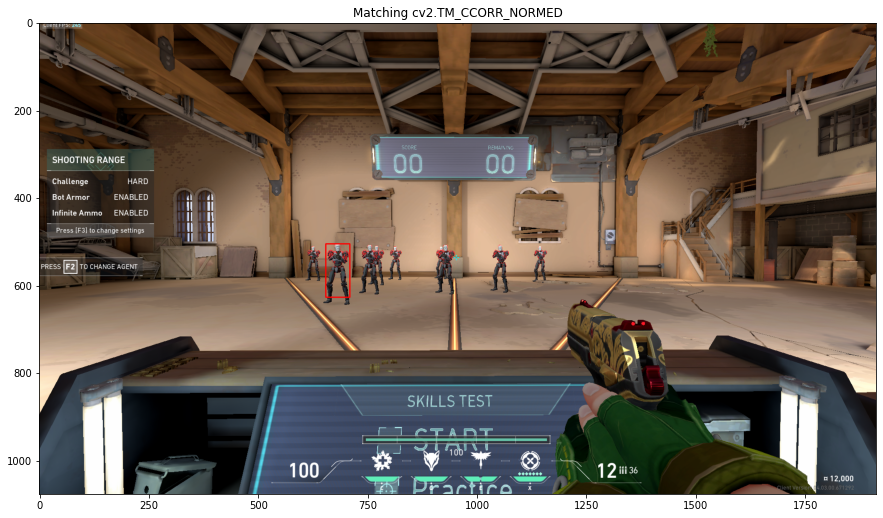

In [7]:
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCORR_NORMED)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.title('Matching cv2.TM_CCORR_NORMED')
plt.imshow(img_rgb)

### TM_SQDIFF AND TM_SQDIFF_NORMED

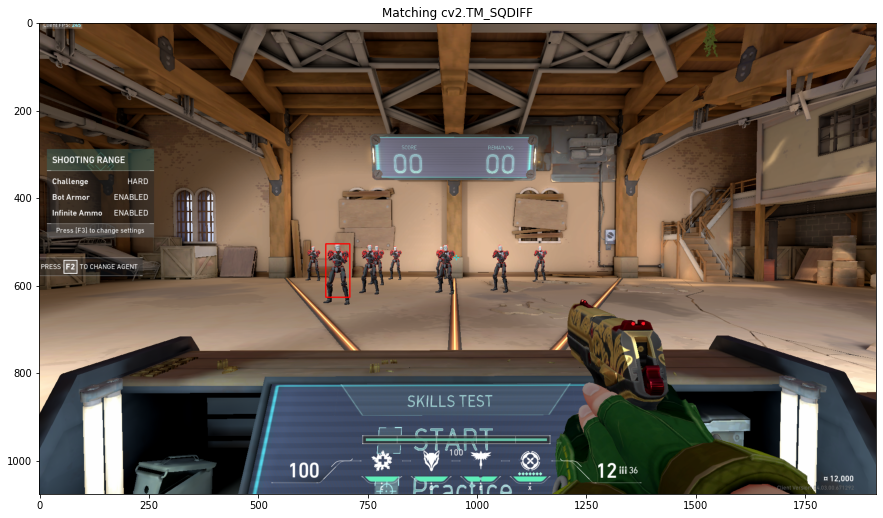

In [8]:
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_SQDIFF)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.title('Matching cv2.TM_SQDIFF')
plt.imshow(img_rgb)

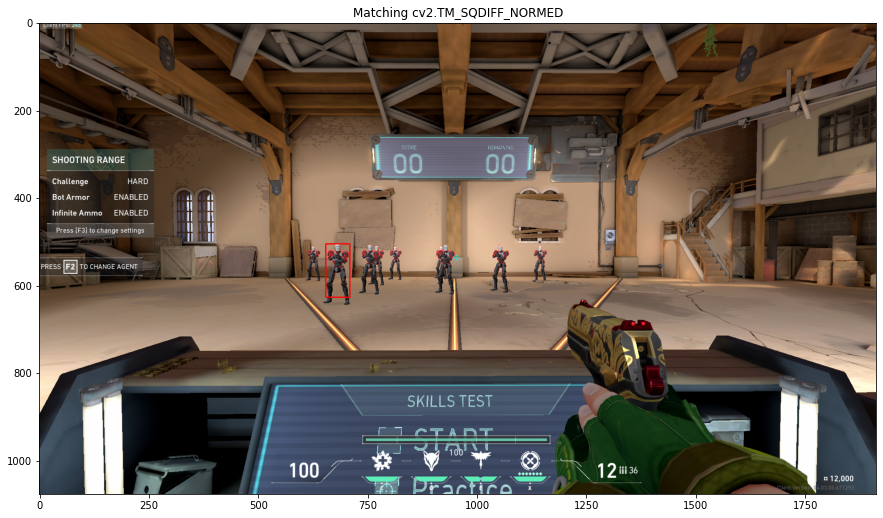

In [9]:
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_SQDIFF_NORMED)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.title('Matching cv2.TM_SQDIFF_NORMED')
plt.imshow(img_rgb)

### Time Performance

In [10]:
%%time
for i in range(100):
    top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCOEFF)

Wall time: 3.45 s


In [11]:
%%time
for i in range(100):
    top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCOEFF_NORMED)

Wall time: 5.28 s


In [12]:
%%time
for i in range(100):
    top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCORR)

Wall time: 2.46 s


In [13]:
%%time
for i in range(100):
    top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCORR_NORMED)

Wall time: 3.23 s


In [14]:
%%time
for i in range(100):
    top_left, bottom_right = return_bouding_box(img, template, cv2.TM_SQDIFF)

Wall time: 3.13 s


In [15]:
%%time
for i in range(100):
    top_left, bottom_right = return_bouding_box(img, template, cv2.TM_SQDIFF_NORMED)

Wall time: 5 s


## Multiple Occurrences

In [16]:
def return_multi_bouding_boxes(img, template, method,criterion='threshold', k_best=5, threshold=0.5):
    """
    Takes in the input image, the template and the method for comparaison
    Outputs the bouding boxes based on either the criterion of the threhold or the k-best. 
    """
    w, h = template.shape[::-1]
    res = cv2.matchTemplate(img, template, method)
    bounding_boxes = []

    if method == cv2.TM_CCOEFF or method == cv2.TM_CCORR or method == cv2.TM_SQDIFF:
        if method == cv2.TM_SQDIFF:
            idx = np.argpartition(res.ravel(),k_best-1)[:k_best-1]
            loc = np.column_stack(np.unravel_index(idx, res.shape))
            for i in range(loc.shape[0]):
                pt = loc[i,:]
                bounding_boxes.append([(int(pt[1]),int(pt[0])),(int(pt[1]) + w,int(pt[0]) + h)])
            return bounding_boxes, res
        else:
            idx = np.argpartition(-res.ravel(),k_best-1)[:k_best-1]
            loc = np.column_stack(np.unravel_index(idx, res.shape))
            for i in range(loc.shape[0]):
                pt = loc[i,:]
                bounding_boxes.append([(int(pt[1]),int(pt[0])),(int(pt[1]) + w,int(pt[0]) + h)])
            return bounding_boxes, res
    else:
        if criterion=='threshold':
            if method == cv2.TM_SQDIFF_NORMED:
                loc = np.where(res <= threshold)
            else:
                loc = np.where(res >= threshold)
            for pt in zip(*loc[::-1]):
                bounding_boxes.append([pt,(pt[0] + w,pt[1] + h)])
            return bounding_boxes, res
        else:
            if method == cv2.TM_SQDIFF_NORMED:
                idx = np.argpartition(res.ravel(),k_best-1)[:k_best-1]
            else:
                idx = np.argpartition(-res.ravel(),k_best-1)[:k_best-1]
            loc = np.column_stack(np.unravel_index(idx, res.shape))
            for i in range(loc.shape[0]):
                pt = loc[i,:]
                bounding_boxes.append([(int(pt[1]),int(pt[0])),(int(pt[1]) + w,int(pt[0]) + h)])
            return bounding_boxes, res

### cv2.TM_CCOEFF and cv2.TM_CCOEFF_NORMED

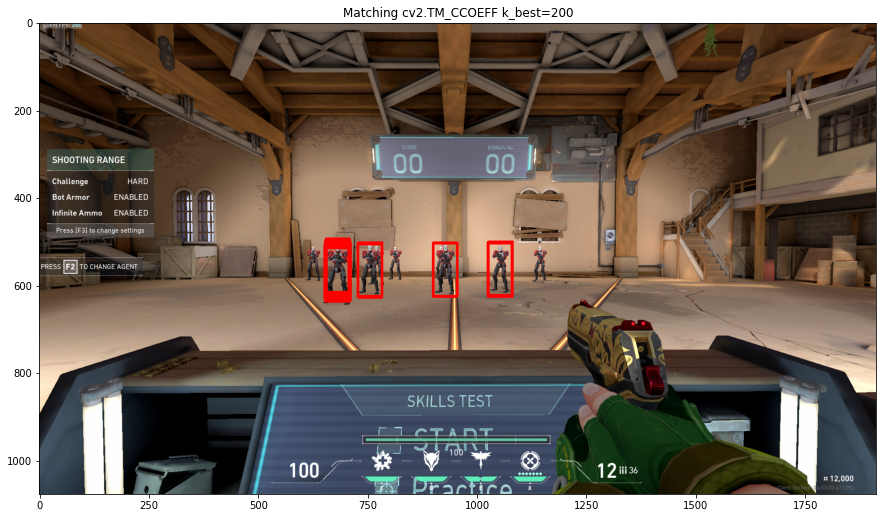

In [230]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
top_left, bottom_right = return_bouding_box(img, template, cv2.TM_CCOEFF)
threshold = 0.5
k_best = 200
boxes, _ = return_multi_bouding_boxes(img, template, cv2.TM_CCOEFF_NORMED,criterion='k_best', k_best=200, threshold=threshold)
for i in range(len(boxes)):
    cv2.rectangle(img_rgb, boxes[i][0], boxes[i][1], 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF k_best={k_best}')
plt.imshow(img_rgb)

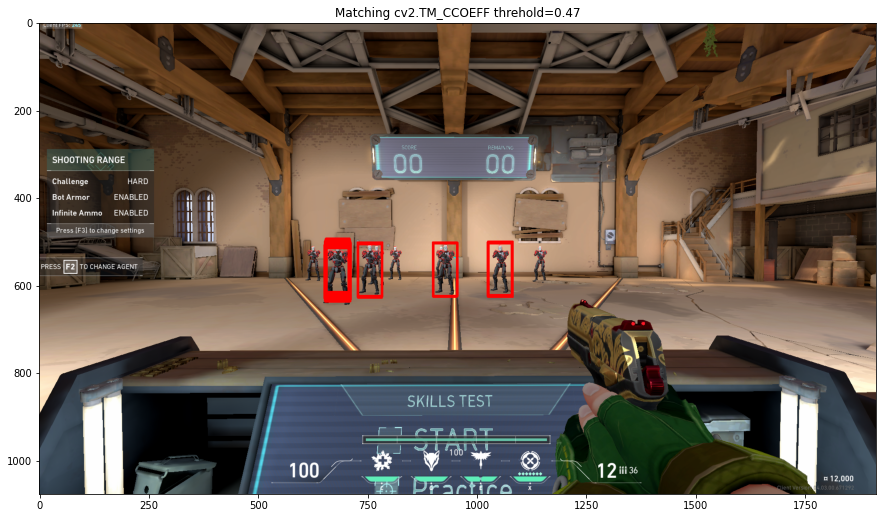

In [237]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
threshold = 0.47
boxes, _ = return_multi_bouding_boxes(img, template, cv2.TM_CCOEFF_NORMED,criterion='threshold', k_best=200, threshold=threshold)
for i in range(len(boxes)):
    cv2.rectangle(img_rgb, boxes[i][0], boxes[i][1], 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={threshold}')
plt.imshow(img_rgb)

### TM_CCORR and TM_CCORR_NORMED

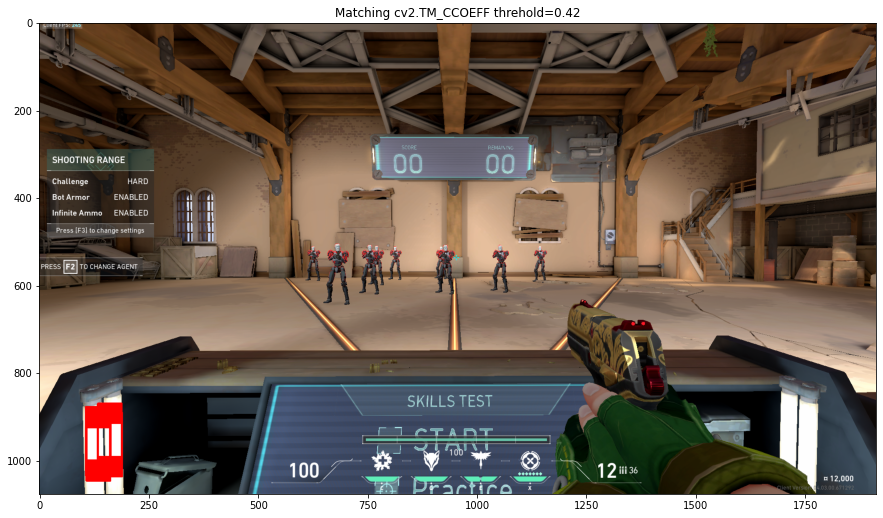

In [27]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
threshold = 0.42
boxes, _ = return_multi_bouding_boxes(img, template, cv2.TM_CCORR,criterion='threshold', k_best=200, threshold=threshold)
for i in range(len(boxes)):
    cv2.rectangle(img_rgb, boxes[i][0], boxes[i][1], 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={threshold}')
plt.imshow(img_rgb)

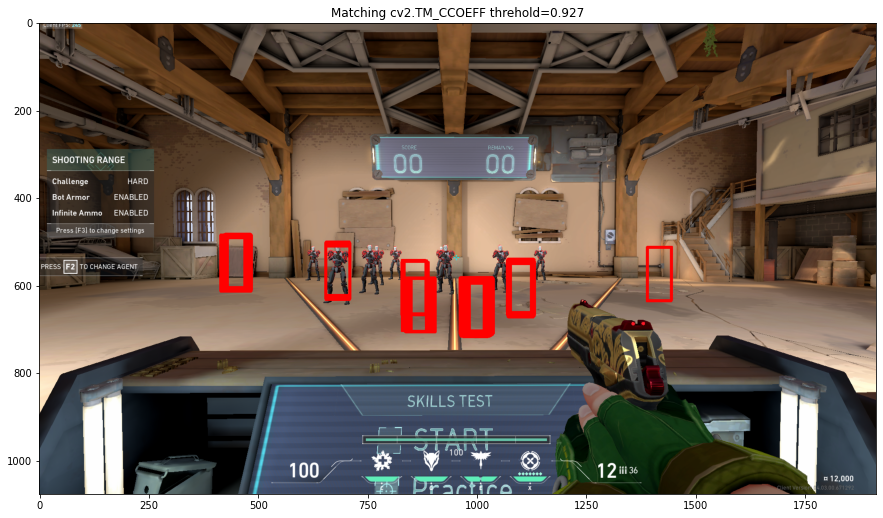

In [234]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
threshold = 0.927
boxes, _ = return_multi_bouding_boxes(img, template, cv2.TM_CCORR_NORMED,criterion='threshold', k_best=200, threshold=threshold)
for i in range(len(boxes)):
    cv2.rectangle(img_rgb, boxes[i][0], boxes[i][1], 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={threshold}')
plt.imshow(img_rgb)

### TM_SQDIFF AND TM_SQDIFF_NORMED

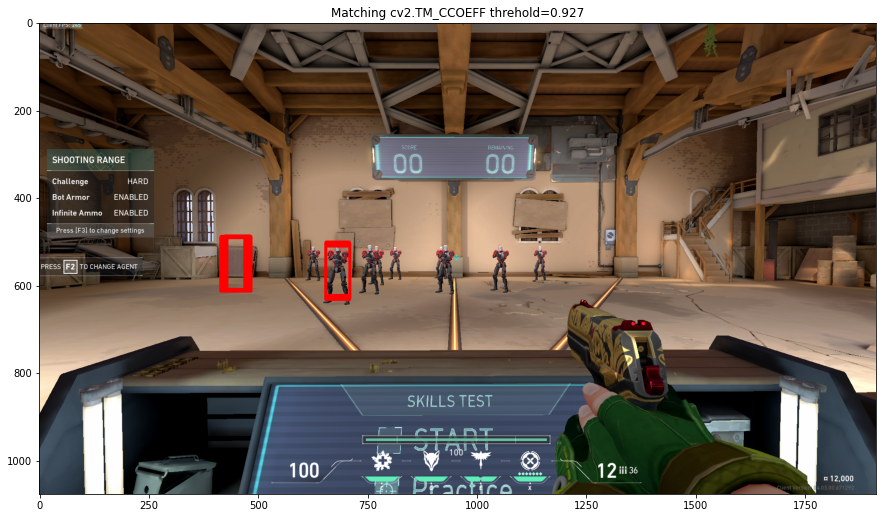

In [38]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
threshold = 0.927
boxes, _ = return_multi_bouding_boxes(img, template, cv2.TM_SQDIFF,criterion='threshold', k_best=200, threshold=threshold)
for i in range(len(boxes)):
    cv2.rectangle(img_rgb, boxes[i][0], boxes[i][1], 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={threshold}')
plt.imshow(img_rgb)

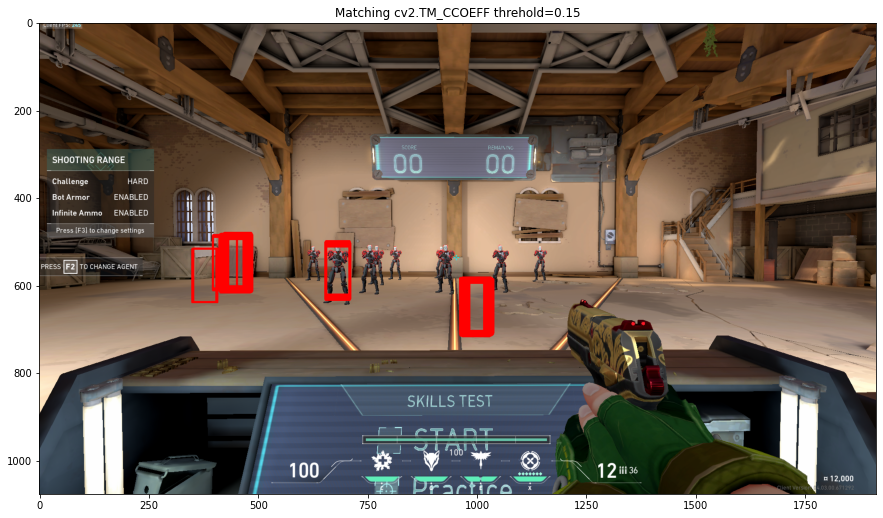

In [44]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
threshold = 0.15
boxes, _ = return_multi_bouding_boxes(img, template, cv2.TM_SQDIFF_NORMED,criterion='threshold', k_best=200, threshold=threshold)
for i in range(len(boxes)):
    cv2.rectangle(img_rgb, boxes[i][0], boxes[i][1], 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={threshold}')
plt.imshow(img_rgb)

## Non Maximum Suppression

In [17]:
def non_maximum_suppresion(boxes, res, thresh_iou):
    """
    Apply non-maximum suppression to avoid detecting too many
    overlapping bounding boxes for a given object.
    Args:
        boxes: The location preds for the image 
        res: results if the template matching
        thresh_iou: (float) The overlap thresh for suppressing unnecessary boxes.
    Returns:
        A list of filtered boxes, Shape: [ , 5]
    """
    x = np.zeros((len(boxes),5))
    for i in range(len(boxes)):
        x[i][0] = boxes[i][0][0]
        x[i][1] = boxes[i][0][1]
        x[i][2] = boxes[i][1][0]
        x[i][3] = boxes[i][1][1]
        x[i][4] = res[int(x[i][1]), int(x[i][0])]
    boxes = x
    # we extract coordinates for every 
    # prediction box present in P
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]

    # we extract the confidence scores as well
    scores = boxes[:, 4]

    # calculate area of every block in P
    areas = (x2 - x1) * (y2 - y1)
    
    # sort the prediction boxes in P
    # according to their confidence scores
    order = scores.argsort()

    # initialise an empty list for 
    # filtered prediction boxes
    keep = []
    

    while len(order) > 0:
        
        # extract the index of the 
        # prediction with highest score
        # we call this prediction S
        idx = order[-1]

        # push S in filtered predictions list
        keep.append(boxes[idx])

        # remove S from P
        order = order[:-1]

        # sanity check
        if len(order) == 0:
            break
        
        # select coordinates of BBoxes according to 
        # the indices in order
        xx1 = x1[order]
        xx2 = x2[order]
        yy1 = y1[order]
        yy2 = y2[order]


        # find the coordinates of the intersection boxes
        xx1 = np.maximum(xx1, x1[idx])
        yy1 = np.maximum(yy1, y1[idx])
        xx2 = np.minimum(xx2, x2[idx])
        yy2 = np.minimum(yy2, y2[idx])

        # find height and width of the intersection boxes
        w = xx2 - xx1
        h = yy2 - yy1
        
        # take max with 0.0 to avoid negative w and h
        # due to non-overlapping boxes
        w = np.clip(w, a_min=0.0, a_max=None)
        h = np.clip(h, a_min=0.0, a_max=None)
        
        # find the intersection area
        inter = w*h

        # find the areas of BBoxes according the indices in order
        rem_areas = areas[order]

        # find the union of every prediction T in P
        # with the prediction S
        # Note that areas[idx] represents area of S
        union = (rem_areas - inter) + areas[idx]
        
        # find the IoU of every prediction in P with S
        IoU = inter / union

        # keep the boxes with IoU less than thresh_iou
        mask = IoU < thresh_iou
        order = order[mask]
    
    return keep


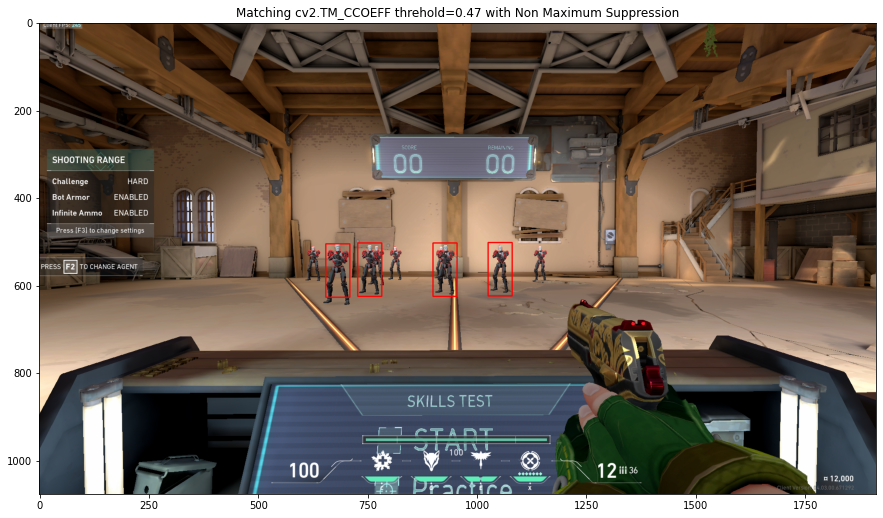

In [419]:
boxes, res = return_multi_bouding_boxes(img, template, cv2.TM_CCOEFF_NORMED,criterion='threshold', k_best=200, threshold=threshold)
boxes_nms = non_maximum_suppresion(boxes, res, 0.5)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
for i in range(len(boxes_nms)):
    cv2.rectangle(img_rgb, (int(boxes_nms[i][0]),int(boxes_nms[i][1])), (int(boxes_nms[i][2]),int(boxes_nms[i][3])), 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={threshold} with Non Maximum Suppression')
plt.imshow(img_rgb)

### Gaussian Pyramids and Downsampling

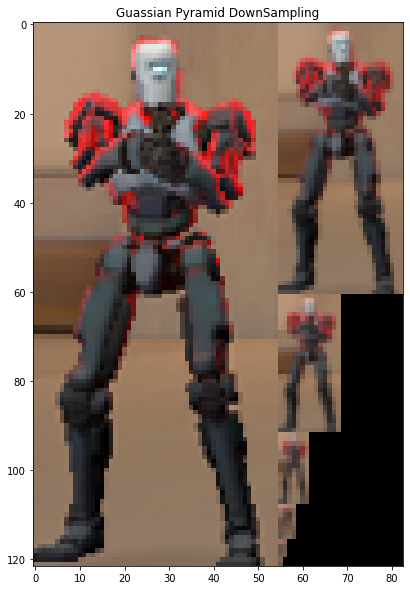

In [18]:
from skimage.transform import pyramid_gaussian


image = cv2.imread('images/truetemplate.png')
rows, cols, dim = image.shape
pyramid = tuple(pyramid_gaussian(image, downscale=2))

composite_image = np.zeros((rows, cols + cols // 2+1, 3), dtype=np.double)

composite_image[:rows, :cols, :] = pyramid[0][:,:,[2,1,0]]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p[:,:,[2,1,0]]
    i_row += n_rows
plt.figure(figsize = (10,10))
plt.title(f'Guassian Pyramid DownSampling')
plt.imshow(composite_image)

In [128]:
a = pyramid[0]*255
a = a.astype(int)
r, g, b = a[:,:,0], a[:,:,1], a[:,:,2]
gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

In [420]:
all_boxes = []
threholds = [0.47, 0.56]
for i in range(2):
    template_ = pyramid[i]
    template_ = template_[:,:,[2,1,0]]
    template_scaled = template_*255
    template_scaled = template_scaled.astype(int)
    r, g, b = template_scaled[:,:,0], template_scaled[:,:,1], template_scaled[:,:,2]
    template_scaled_gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    template_scaled_gray = template_scaled_gray.astype(np.uint8)
    bboxes,_ = return_multi_bouding_boxes(img, template_scaled_gray, cv2.TM_CCOEFF_NORMED,criterion='threshold', threshold=threholds[i])
    boxes_nms = non_maximum_suppresion(bboxes, res, 0.5)
    all_boxes.append(boxes_nms)
all_boxes = sum(all_boxes, [])

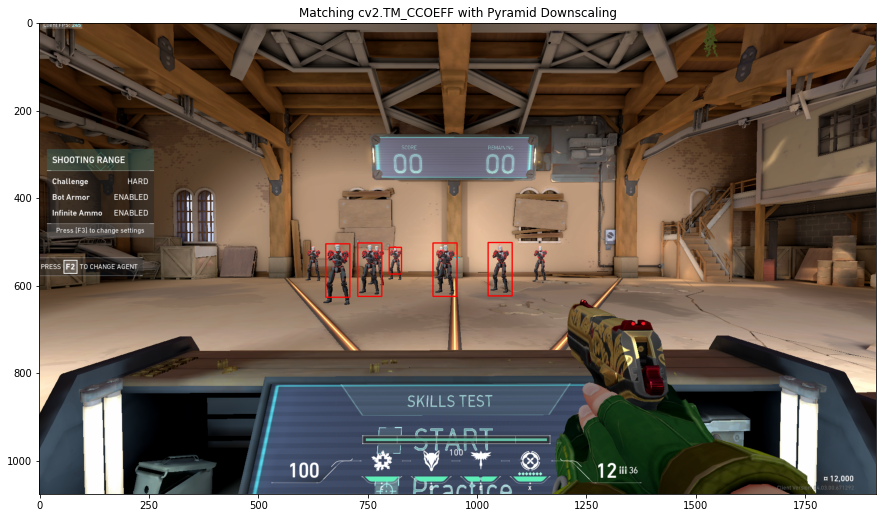

In [425]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
for i in range(len(all_boxes)):
    cv2.rectangle(img_rgb, (int(all_boxes[i][0]),int(all_boxes[i][1])), (int(all_boxes[i][2]),int(all_boxes[i][3])), 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF with Pyramid Downscaling')
plt.imshow(img_rgb)

In [6]:
def maximum_suppression_beta(boxes, thresh_iou=0.5):
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]

    # we extract the confidence scores as well
    scores = boxes[:, 4]

    # calculate area of every block in P
    areas = (x2 - x1) * (y2 - y1)
    
    # sort the prediction boxes in P
    # according to their confidence scores
    order = scores.argsort()

    # initialise an empty list for 
    # filtered prediction boxes
    keep = []
    

    while len(order) > 0:
        
        # extract the index of the 
        # prediction with highest score
        # we call this prediction S
        idx = order[-1]

        # push S in filtered predictions list
        keep.append(boxes[idx])

        # remove S from P
        order = order[:-1]

        # sanity check
        if len(order) == 0:
            break
        
        # select coordinates of BBoxes according to 
        # the indices in order
        xx1 = x1[order]
        xx2 = x2[order]
        yy1 = y1[order]
        yy2 = y2[order]


        # find the coordinates of the intersection boxes
        xx1 = np.maximum(xx1, x1[idx])
        yy1 = np.maximum(yy1, y1[idx])
        xx2 = np.minimum(xx2, x2[idx])
        yy2 = np.minimum(yy2, y2[idx])

        # find height and width of the intersection boxes
        w = xx2 - xx1
        h = yy2 - yy1
        
        # take max with 0.0 to avoid negative w and h
        # due to non-overlapping boxes
        w = np.clip(w, a_min=0.0, a_max=None)
        h = np.clip(h, a_min=0.0, a_max=None)
        
        # find the intersection area
        inter = w*h

        # find the areas of BBoxes according the indices in order
        rem_areas = areas[order]

        # find the union of every prediction T in P
        # with the prediction S
        # Note that areas[idx] represents area of S
        union = (rem_areas - inter) + areas[idx]
        
        # find the IoU of every prediction in P with S
        IoU = inter / union

        # keep the boxes with IoU less than thresh_iou
        mask = IoU < thresh_iou
        order = order[mask]
    return keep

### Multiscaling in template matching

In [19]:
def invariant_scale_tm(image, template, threshold= 0.57, thresh_iou=0.5, start=0.4, end=1.0, precision=100):
    template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    image = cv2.cvtColor(image_o, cv2.COLOR_BGR2GRAY)
    boxes_nms_all = []
    w, h = template.shape[::-1]
    for scale in np.linspace(start, end, precision)[::-1]:
        resized = imutils.resize(template, width = int(template.shape[1] * scale))
        w, h = resized.shape[::-1]
        boxes, res = return_multi_bouding_boxes(image, resized, cv2.TM_CCOEFF_NORMED,criterion='threshold', threshold=threshold)
        boxes_nms = non_maximum_suppresion(boxes, res, thresh_iou=thresh_iou)
        boxes_nms_all.append(boxes_nms)


    boxes_nms_all = np.array(sum(boxes_nms_all, []))
    boxes_nms_all = maximum_suppression_beta(boxes_nms_all, thresh_iou=thresh_iou)
    return boxes_nms_all

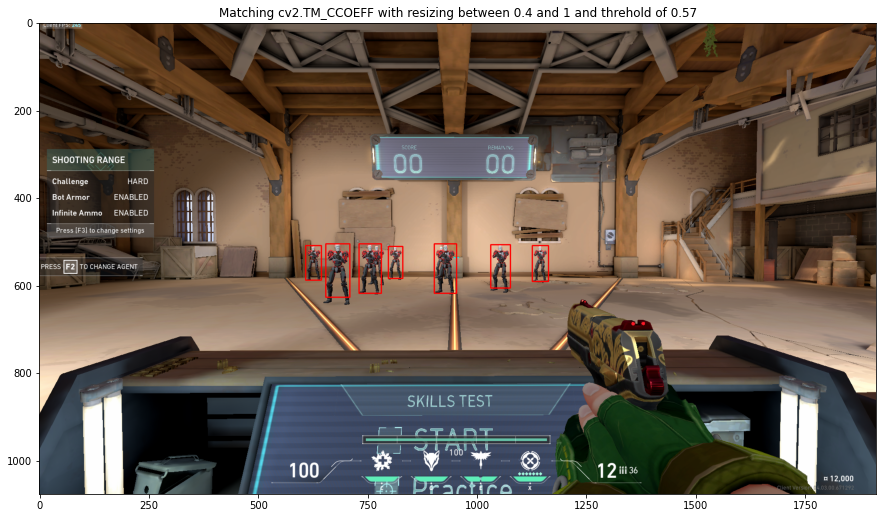

In [665]:
template = cv2.imread('images/truetemplate.png') # template image
image_o = cv2.imread('images/rangebots.png') # image
img_rgb = cv2.cvtColor(image_o, cv2.COLOR_BGR2RGB)

boxes_nms_all = invariant_scale_tm(image, template, threshold= 0.57, thresh_iou=0.5)
for i in range(len(boxes_nms_all)):
    cv2.rectangle(img_rgb, (int(boxes_nms_all[i][0]),int(boxes_nms_all[i][1])), (int(boxes_nms_all[i][2]),int(boxes_nms_all[i][3])), 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF with resizing between 0.4 and 1 and threhold of 0.57')
plt.imshow(img_rgb)

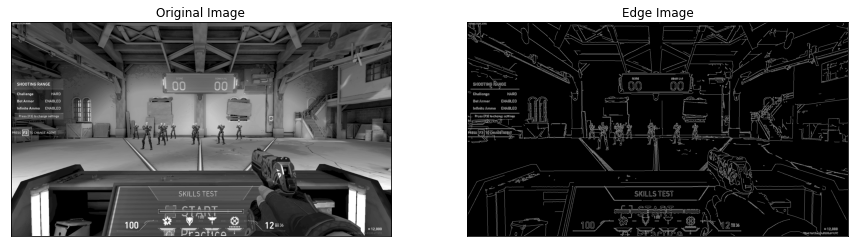

In [19]:
img = cv2.imread('images/rangebots.png',0)
edges = cv2.Canny(img,100,200)
template = cv2.imread('images/truetemplate.png',0)
edges_template = cv2.Canny(template,100,200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

In [40]:
res = cv2.matchTemplate(edges, edges_template, cv2.TM_CCOEFF_NORMED)

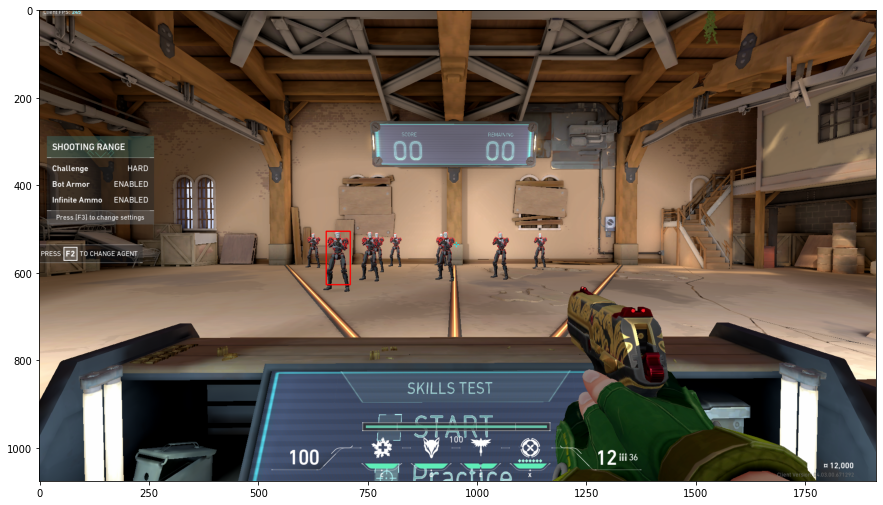

In [25]:
top_left, bottom_right = return_bouding_box(edges, edges_template, cv2.TM_CCOEFF_NORMED)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
cv2.rectangle(img_rgb, top_left, bottom_right, 255, 2)
plt.imshow(img_rgb)

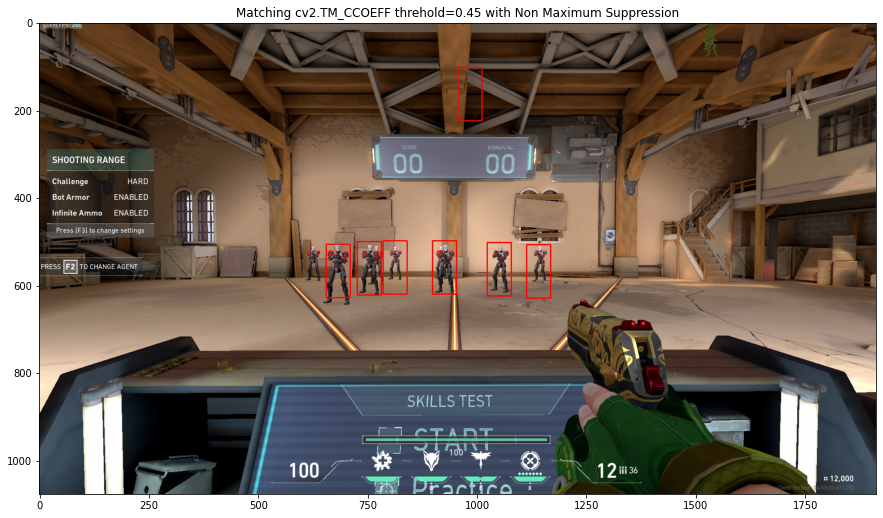

In [52]:
boxes, res = return_multi_bouding_boxes(edges, edges_template, cv2.TM_CCOEFF_NORMED,criterion='threshold', k_best=200, threshold=0.117)
boxes_nms = non_maximum_suppresion(boxes, res, 0.5)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
for i in range(len(boxes_nms)):
    cv2.rectangle(img_rgb, (int(boxes_nms[i][0]),int(boxes_nms[i][1])), (int(boxes_nms[i][2]),int(boxes_nms[i][3])), 255, 2)
plt.title(f'Matching cv2.TM_CCOEFF threhold={0.45} with Non Maximum Suppression')
plt.imshow(img_rgb)

In [58]:
def invariant_scale_tm(image, template, threshold= 0.57, thresh_iou=0.5, start=0.4, end=1.0, precision=100):
#     template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
#     image = cv2.cvtColor(image_o, cv2.COLOR_BGR2GRAY)

    return boxes_nms_all

In [69]:
boxes_nms_all = []
w, h = edges_template.shape[::-1]
for scale in np.linspace(0.4, 1, 10)[::-1]:
    resized = imutils.resize(edges_template, width = int(template.shape[1] * scale))
    w, h = resized.shape[::-1]
    boxes, res = return_multi_bouding_boxes(edges, resized, cv2.TM_CCOEFF_NORMED,criterion='threshold', threshold=0.2)
    boxes_nms = non_maximum_suppresion(boxes, res, thresh_iou=0.5)
    boxes_nms_all.append(boxes_nms)


boxes_nms_all = np.array(sum(boxes_nms_all, []))
boxes_nms_all = maximum_suppression_beta(boxes_nms_all, thresh_iou=0.5)

In [117]:
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

In [ ]:
image = cv2.imread('images/rangebots.png')
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
rects, weights = hog.detectMultiScale(img_gray[490:650,600:1200], winStride=(2, 2), padding=(10, 10), scale=1.1)

In [ ]:
image = image[490:650,600:1200]
for i, (x, y, w, h) in enumerate(rects):
    if weights[i] < 0.13:
        continue
    elif weights[i] < 0.3 and weights[i] > 0.13:
        cv2.rectangle(image, (x, y), (x+w, y+h), (0, 0, 255), 2)
    if weights[i] < 0.7 and weights[i] > 0.3:
        cv2.rectangle(image, (x, y), (x+w, y+h), (50, 122, 255), 2)
    if weights[i] > 0.7:
        cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)

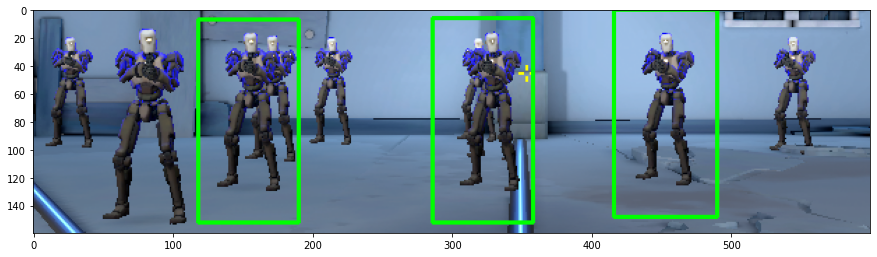

In [ ]:
plt.imshow(image)

In [217]:
img1 = cv2.imread('images/rangebots.png',cv2.IMREAD_GRAYSCALE)          # queryImage
img2 = cv2.imread('images/truetemplate.png',cv2.IMREAD_GRAYSCALE) # trainImage

img1 = img1[490:650,600:1200]
img_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_rgb = img1[490:650,600:1200]
# Initiate ORB detector
sift = cv2.SIFT_create()
# find the keypoints and descriptors with ORB
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2, None)

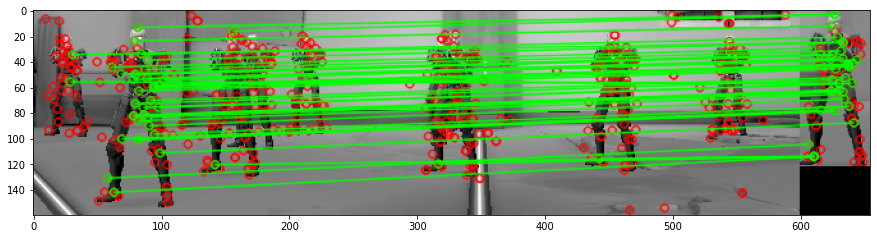

(<matplotlib.image.AxesImage at 0x1849a5efee0>, None)

In [220]:
# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary

flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.5*n.distance:
        matchesMask[i]=[1,0]
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv2.DrawMatchesFlags_DEFAULT)
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
plt.imshow(img3),plt.show()

In [222]:
from skimage.feature import hog

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    """
    Return the hog features of the given input image
    Call with two outputs if vis==True"""
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualize=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualize=vis, feature_vector=feature_vec)
        return features

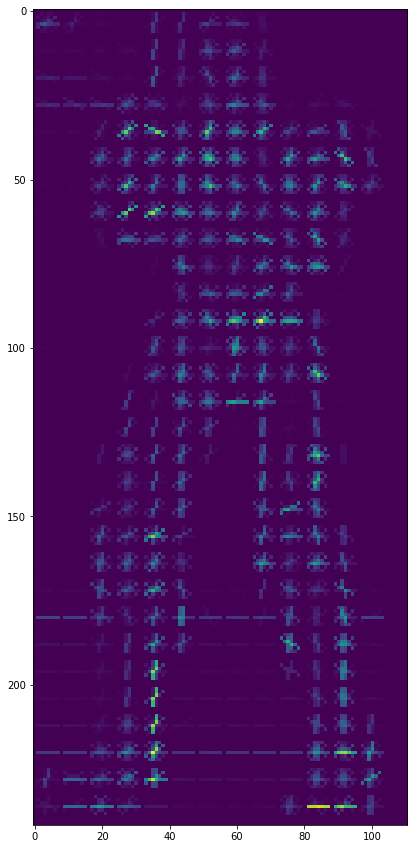

In [234]:
img1 = cv2.imread('images/positives/2.png',cv2.IMREAD_GRAYSCALE) 
orient = 9
pix_per_cell = 8
cell_per_block = 2
plt.imshow(get_hog_features(img1, orient, pix_per_cell, cell_per_block, vis=True)[1])